### 화면 가로 확장

In [1]:
# 화면 가로 확장 코드 (기본 width 50%)
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:80% !important; }</style>"))

### 모듈 임포트

In [2]:
import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import seaborn as sns
import tensorflow as tf
import csv
import os
import datetime

### GPU 확인

In [3]:
tf.test.gpu_device_name()

'/device:GPU:0'

### 3년치 데이터 합본 저장, 확인

In [4]:
df_3Y = pd.DataFrame()
for y in range(2013, 2016):
    file = './Combined_Data/'+str(y)+'_'+'House1_Ch1_Combined_Data_Y.csv'
    df_y= pd.read_csv(file, encoding='cp949')
    df_3Y = pd.concat([df_3Y, df_y])
    
df_3Y = df_3Y.drop([df_3Y.columns[0]], axis=1)
df_3Y = df_3Y.reset_index(drop=True)
df_3Y.to_csv("./Combined_Data/House1_Ch1_Combined_Data_13-15.csv", encoding='cp949')

In [5]:
Data_3Y = pd.read_csv('./Combined_Data/House1_Ch1_Combined_Data_13-15.csv', encoding='cp949')
Data_3Y.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 26280 entries, 0 to 26279
Data columns (total 9 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Unnamed: 0  26280 non-null  int64  
 1   DateTime    26280 non-null  int64  
 2   Graph_Date  26280 non-null  object 
 3   Day         26280 non-null  object 
 4   Holiday     26280 non-null  int64  
 5   Seq         26280 non-null  int64  
 6   Watt        26280 non-null  int64  
 7   Temp        26280 non-null  float64
 8   CPI         26280 non-null  float64
dtypes: float64(2), int64(5), object(2)
memory usage: 1.8+ MB


### 4년치 데이터 합본 저장, 확인

In [6]:
df_4Y = pd.DataFrame()
for y in range(2013, 2017):
    file = './Combined_Data/'+str(y)+'_'+'House1_Ch1_Combined_Data_Y.csv'
    df_y= pd.read_csv(file, encoding='cp949')
    df_4Y = pd.concat([df_4Y, df_y])
    
df_4Y = df_4Y.drop([df_4Y.columns[0]], axis=1)
df_4Y = df_4Y.reset_index(drop=True)
df_4Y.to_csv("./Combined_Data/House1_Ch1_Combined_Data_13-16.csv", encoding='cp949')

In [7]:
Data_4Y = pd.read_csv('./Combined_Data/House1_Ch1_Combined_Data_13-16.csv', encoding='cp949')
Data_4Y.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 35040 entries, 0 to 35039
Data columns (total 9 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Unnamed: 0  35040 non-null  int64  
 1   DateTime    35040 non-null  int64  
 2   Graph_Date  35040 non-null  object 
 3   Day         35040 non-null  object 
 4   Holiday     35040 non-null  int64  
 5   Seq         35040 non-null  int64  
 6   Watt        35040 non-null  int64  
 7   Temp        35040 non-null  float64
 8   CPI         35040 non-null  float64
dtypes: float64(2), int64(5), object(2)
memory usage: 2.4+ MB


### 각 연도별 csv 데이터 로드

In [8]:
Data_2013=pd.read_csv('./Combined_Data/2013_House1_Ch1_Combined_Data_Y.csv', encoding='cp949')
Data_2014=pd.read_csv('./Combined_Data/2014_House1_Ch1_Combined_Data_Y.csv', encoding='cp949')
Data_2015=pd.read_csv('./Combined_Data/2015_House1_Ch1_Combined_Data_Y.csv', encoding='cp949')
Data_2016=pd.read_csv('./Combined_Data/2016_House1_Ch1_Combined_Data_Y.csv', encoding='cp949')

### Plt 그래프 함수

In [9]:
def Graph(name1, name2, year):
    font_head = {'color': 'w', 'weight': 'bold', 'size': 20}
    font_body = {'color': 'w', 'weight': 'bold', 'size': 15}

    # 1번째 그래프
    ax1 = plt.subplot(2, 1, 1)
    ax1.spines['left'].set_color('yellow')
    ax1.spines['left'].set_lw(2)
    ax1.spines['bottom'].set_color('yellow')
    ax1.spines['bottom'].set_lw(2)

    ax1.tick_params(axis='x', colors='white', size=10)
    ax1.tick_params(axis='x', colors='white', labelsize=15)
    ax1.tick_params(axis='y', colors='white', size=10)
    ax1.tick_params(axis='y', colors='white', labelsize=15)

    plt.plot(x, y1, '.-', color='y', linewidth=1)
    plt.title(name1, fontdict=font_head, pad=20)
    plt.xticks(visible=False)
    plt.ylabel('Watt',labelpad=15, fontdict=font_body)

    # 2번째 그래프
    ax2 = plt.subplot(2, 1, 2, sharex=ax1)
    ax2.spines['left'].set_color('blue')
    ax2.spines['left'].set_lw(2)
    ax2.spines['bottom'].set_color('blue')
    ax2.spines['bottom'].set_lw(2)

    ax2.tick_params(axis='x', colors='white', size=10)
    ax2.tick_params(axis='x', colors='white', labelsize=15)
    ax2.tick_params(axis='y', colors='white', size=10)
    ax2.tick_params(axis='y', colors='white', labelsize=15)

    plt.plot(x, y2, '.-', color='b', linewidth=1)
    plt.title(name2, fontdict=font_head, pad=20)
    plt.xlabel('Time',labelpad=15, fontdict=font_body)
    plt.ylabel('Temp',labelpad=15, fontdict=font_body)
    
    if year==1:
        plt.xticks([0, 31, 59, 90, 120, 151, 181, 212, 243, 273, 304, 334], labels=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
    if year==3:
        plt.xticks([0, 365, 730], labels=['2013', '2014', '2015'])

    #plt.tight_layout()
    plt.show()

#### 1년치 그래프 확인

#### 2013

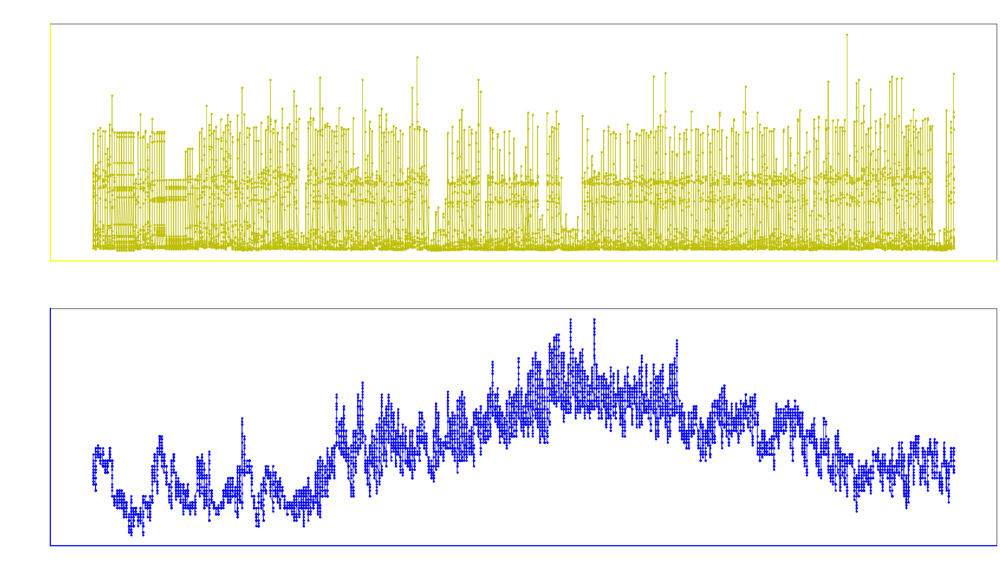

In [10]:
x = Data_2013['Graph_Date']
y1 = Data_2013['Watt']
y2 = Data_2013['Temp']

plt.figure(figsize=(30,17))

Graph("2013's Time-Watt Graph", "2013's Time-Temp Graph", 1)

#### 2014

In [ ]:
x = Data_2014['Graph_Date']
y1 = Data_2014['Watt']
y2 = Data_2014['Temp']

plt.figure(figsize=(30,17))

Graph("2014's Time-Watt Graph", "2014's Time-Temp Graph", 1)

#### 2015

In [ ]:
x = Data_2015['Graph_Date']
y1 = Data_2015['Watt']
y2 = Data_2015['Temp']

plt.figure(figsize=(30,17))

Graph("2015's Time-Watt Graph", "2015's Time-Temp Graph", 1)

#### 3년치 데이터 그래프 확인

#### 2013-2015

In [ ]:
x = Data_3Y['Graph_Date']
y1 = Data_3Y['Watt']
y2 = Data_3Y['Temp']

plt.figure(figsize=(40,17))

Graph("13-15's Time-Watt Graph","13-15's Time-Temp Graph", 3)

### 데이터 정규화

#### Total Data Set 4년치 정규화

#### Min-Max Scaling

In [50]:
from sklearn.preprocessing import MinMaxScaler

# 정규화 과정을 거쳐 데이터 범위를 원하는 범위로 제한. 그래프는 동일하나 손실 정도를 확인하기에 더 좋음.
#배치 정규화는 기울기 소멸 문제를 해결하기는 좋으나, RNN의 경우 계층별로 미니 정규화 적용이 필요해 모델이 복잡해지고 효율이 저하됨.
Data_4Y.sort_index(ascending=False).reset_index(drop=True)

scaler = MinMaxScaler()
scale_cols = ['Holiday', 'Watt', 'Temp', 'CPI']
Data_4Y_scaled = scaler.fit_transform(Data_4Y[scale_cols])
Data_4Y_scaled = pd.DataFrame(Data_4Y_scaled)
Data_4Y_scaled.columns = scale_cols

Data_4Y_scaled.insert(0, 'DateTime', Data_4Y['DateTime'])
Data_4Y_scaled.insert(1, 'Graph_Date', Data_4Y['Graph_Date'])
Data_4Y_scaled

,DateTime,Graph_Date,Holiday,Watt,Temp,CPI
0,20130101,2013-01-01,1.0,0.270038,0.360000,0.933333
1,20130101,2013-01-01,1.0,0.268530,0.333333,0.933333
2,20130101,2013-01-01,1.0,0.263775,0.320000,0.933333
3,20130101,2013-01-01,1.0,0.011368,0.306667,0.933333
4,20130101,2013-01-01,1.0,0.010788,0.306667,0.933333
...,...,...,...,...,...,...
35035,20161231,2016-12-31,1.0,0.024707,0.333333,0.566667
35036,20161231,2016-12-31,1.0,0.182809,0.333333,0.566667
35037,20161231,2016-12-31,1.0,0.089781,0.306667,0.566667
35038,20161231,2016-12-31,1.0,0.049878,0.306667,0.566667


#### 데이터 연관성 분석

In [51]:
import scipy.stats as stats

# 피어슨 stat을 이용하면 피어슨 상관계수와 p-value값이 출력되는데 상관계수는 양 or 음의 비례관계 정도를, p-value는 상관 정도를 보여준다. (0에 가까울수록 영향이 크다.)

Correlation=stats.pearsonr(Data_4Y_scaled['Holiday'], Data_4Y_scaled['Watt'])
print('< Holiday - Watt >')
print('P-value ==>> %.3f\n' %Correlation[1])

Correlation=stats.pearsonr(Data_4Y_scaled['Temp'], Data_4Y_scaled['Watt'])
print('< Temp - Watt >')
print('P-value ==>> %.3f\n' %Correlation[1])

Correlation=stats.pearsonr(Data_4Y_scaled['CPI'], Data_4Y_scaled['Watt'])
print('< CPI - Watt >')
print('P-value ==>> %.3f\n' %Correlation[1])

< Holiday - Watt >
P-value ==>> 0.000

< Temp - Watt >
P-value ==>> 0.169

< CPI - Watt >
P-value ==>> 0.000



### 데이터셋 편집

In [52]:
TEST_SIZE = 8761 # 1년치를 테스트셋으로 사용
WINDOW_SIZE = 1 # 얼마 동안의 과거 기반의 데이터에 기반하여 다음날의 값을 예측할 것인지 설정. 1=1시간을 의미

train = Data_4Y_scaled[:-TEST_SIZE]
test= Data_4Y_scaled[-TEST_SIZE:]

In [53]:
def make_dataset(data, label, window_size=1):
    feature_list = []
    label_list = []
    for i in range(len(data) - window_size):
        feature_list.append(np.array(data.iloc[i:i+window_size]))
        label_list.append(np.array(label.iloc[i+window_size]))
    return np.array(feature_list), np.array(label_list)

In [54]:
from sklearn.model_selection import train_test_split

feature_cols = ['Holiday', 'Watt', 'Temp', 'CPI']
label_cols = ['Watt']

train_feature = train[feature_cols]
train_label = train[label_cols]

train_feature, train_label = make_dataset(train_feature, train_label, 1)# 여기서도 일자 설정

x_train, x_valid, y_train, y_valid = train_test_split(train_feature, train_label, test_size=0.33333, shuffle=False)

In [55]:
print(' x_train >> {0}\n x_valid >> {1}\n y_train >> {2}\n y_valid >> {3}'.format(x_train.shape, x_valid.shape, y_train.shape, y_valid.shape))

 x_train >> (17518, 1, 4)
 x_valid >> (8760, 1, 4)
 y_train >> (17518, 1)
 y_valid >> (8760, 1)


In [56]:
x_test = test[feature_cols]
y_test = test[label_cols]

In [57]:
x_test, y_test = make_dataset(x_test, y_test, 1)
x_test.shape, y_test.shape

((8760, 1, 4), (8760, 1))

### 딥러닝 모델

In [58]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from tensorflow.keras.layers import LSTM
from tensorflow.keras.layers import Bidirectional
import keras

tf.debugging.set_log_device_placement(True)

with tf.device('/GPU:0'):
    model = Sequential()
    model.add(LSTM(256, activation='ReLU', input_shape=(train_feature.shape[1], train_feature.shape[2]), return_sequences=True))
    model.add(Bidirectional(LSTM(128, activation='ReLU', return_sequences=True), merge_mode='concat'))
    #model.add(LSTM(256, activation='ReLU', return_sequences = True))
    #model.add(Bidirectional(LSTM(128, activation='ReLU', return_sequences=True), merge_mode='concat'))
    model.add(LSTM(128, activation='ReLU', return_sequences = True))
    model.add(Bidirectional(LSTM(64, activation='ReLU', return_sequences=True), merge_mode='concat'))
    model.add(LSTM(64, activation='ReLU', return_sequences = True))
    model.add(Bidirectional(LSTM(32, activation='ReLU', return_sequences=True), merge_mode='concat'))
    model.add(LSTM(32, activation='ReLU', return_sequences = False))
    model.add(Dense(1, activation = 'sigmoid'))
    model.summary()

Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op RandomUniform in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Sub in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mul in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Add in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op RandomStandardNormal in devic

Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ConcatV2 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op RandomUniform in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Sub in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mul in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Add in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op RandomStandardNormal in device /job:localhost/replica:0/task:0/

Executing op Mul in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ConcatV2 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op RandomUniform in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Sub in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mul in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Add in device /job:localhost/replica:0/task:0/device:GPU:0
Exec

In [59]:
import os

# 시간 표시, 측정용
now = datetime.datetime.now() # 현재 시각
TimeNow = now.strftime('%Y-%m-%d  %H:%M:%S') # 시작 시각 표시용.

with tf.device('/GPU:0'):
    print('Start Time >>', TimeNow, '\n')
    now = datetime.datetime.now()
    start = now

    model.compile(loss='mean_squared_error', optimizer='Nadam')
    early_stop = EarlyStopping(monitor='val_loss', patience=8)

    model_path = 'model'
    filename = os.path.join(model_path, 'tmp_checkpoint.h5')
    checkpoint = ModelCheckpoint(filename, monitor='val_loss', verbose=1, save_best_only=True, mode='auto')
    history = model.fit(x_train, y_train, epochs=40, batch_size=32,validation_data=(x_valid, y_valid), callbacks=[early_stop, checkpoint])

    now = datetime.datetime.now()
    end = now
    elapsed_time = end-start
    elapsed_time = str(elapsed_time).split(".")
    elapsed_time = elapsed_time[0]
    print('소요시간 >> ', elapsed_time)

Start Time >> 2022-02-19  00:14:14 

Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0

Executing op DestroyResourceOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op DestroyResourceOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op DestroyResourceOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op DestroyResourceOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op DestroyResourceOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op DestroyResourceOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op DestroyResourceOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op DestroyResourceOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op DestroyResourceOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op DestroyResourceOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op DestroyResourceOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op DestroyResourceOp in device /job:localhos

Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhos

Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/repli

 65/548 [==>...........................] - ETA: 31s - loss: 0.1227Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


114/548 [=====>........................] - ETA: 28s - loss: 0.0816Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


163/548 [=======>......................] - ETA: 25s - loss: 0.0634Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


212/548 [==========>...................] - ETA: 21s - loss: 0.0538Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


261/548 [=============>................] - ETA: 18s - loss: 0.0477Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


310/548 [===============>..............] - ETA: 15s - loss: 0.0433Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


359/548 [==================>...........] - ETA: 12s - loss: 0.0404Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


408/548 [=====================>........] - ETA: 9s - loss: 0.0380Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


457/548 [========================>.....] - ETA: 5s - loss: 0.0359Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


506/548 [==========================>...] - ETA: 2s - loss: 0.0344Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


548/548 [==============================] - ETA: 0s - loss: 0.0335Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in dev

Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142

Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/dev

Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/dev

Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/dev

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

 78/548 [===>..........................] - ETA: 29s - loss: 0.0183Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


127/548 [=====>........................] - ETA: 26s - loss: 0.0196Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


176/548 [========>.....................] - ETA: 23s - loss: 0.0195Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


225/548 [===========>..................] - ETA: 20s - loss: 0.0198Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


274/548 [==============>...............] - ETA: 17s - loss: 0.0199Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


323/548 [================>.............] - ETA: 14s - loss: 0.0201Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


372/548 [===================>..........] - ETA: 11s - loss: 0.0203Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


421/548 [======================>.......] - ETA: 8s - loss: 0.0203Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


470/548 [========================>.....] - ETA: 4s - loss: 0.0205Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


519/548 [===========================>..] - ETA: 1s - loss: 0.0204Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


548/548 [==============================] - ETA: 0s - loss: 0.0203Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_t

Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/dev

Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/dev

Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/dev


Epoch 00002: val_loss improved from 0.02796 to 0.02227, saving model to model\tmp_checkpoint.h5
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identit

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

 49/548 [=>............................] - ETA: 31s - loss: 0.0211Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


 98/548 [====>.........................] - ETA: 28s - loss: 0.0214Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


147/548 [=======>......................] - ETA: 25s - loss: 0.0211Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


196/548 [=========>....................] - ETA: 22s - loss: 0.0209Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


245/548 [============>.................] - ETA: 19s - loss: 0.0207Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


294/548 [===============>..............] - ETA: 15s - loss: 0.0205Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


343/548 [=================>............] - ETA: 12s - loss: 0.0206Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


392/548 [====================>.........] - ETA: 9s - loss: 0.0204Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


441/548 [=======================>......] - ETA: 6s - loss: 0.0202Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


490/548 [=========================>....] - ETA: 3s - loss: 0.0203Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


539/548 [============================>.] - ETA: 0s - loss: 0.0202Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


548/548 [==============================] - ETA: 0s - loss: 0.0202Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_t

Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/dev

Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/dev

Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/dev

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

 68/548 [==>...........................] - ETA: 29s - loss: 0.0203Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


117/548 [=====>........................] - ETA: 27s - loss: 0.0203Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


166/548 [========>.....................] - ETA: 23s - loss: 0.0204Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


215/548 [==========>...................] - ETA: 20s - loss: 0.0206Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


264/548 [=============>................] - ETA: 17s - loss: 0.0205Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


313/548 [================>.............] - ETA: 14s - loss: 0.0204Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


362/548 [==================>...........] - ETA: 11s - loss: 0.0203Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


411/548 [=====================>........] - ETA: 8s - loss: 0.0204Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


460/548 [========================>.....] - ETA: 5s - loss: 0.0201Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


509/548 [==========================>...] - ETA: 2s - loss: 0.0201Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


548/548 [==============================] - ETA: 0s - loss: 0.0201Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_t

Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/dev

Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/dev

Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/dev

Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/dev

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

 88/548 [===>..........................] - ETA: 29s - loss: 0.0202Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


137/548 [======>.......................] - ETA: 26s - loss: 0.0200Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


186/548 [=========>....................] - ETA: 22s - loss: 0.0202Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


235/548 [===========>..................] - ETA: 20s - loss: 0.0201Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


284/548 [==============>...............] - ETA: 16s - loss: 0.0200Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


333/548 [=================>............] - ETA: 13s - loss: 0.0199Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


382/548 [===================>..........] - ETA: 10s - loss: 0.0200Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


431/548 [======================>.......] - ETA: 7s - loss: 0.0200Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


480/548 [=========================>....] - ETA: 4s - loss: 0.0201Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


529/548 [===========================>..] - ETA: 1s - loss: 0.0201Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


548/548 [==============================] - ETA: 0s - loss: 0.0201Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_t

Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/dev

Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/dev

Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/dev

 56/548 [==>...........................] - ETA: 31s - loss: 0.0198Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


105/548 [====>.........................] - ETA: 28s - loss: 0.0197Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


154/548 [=======>......................] - ETA: 26s - loss: 0.0195Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


203/548 [==========>...................] - ETA: 23s - loss: 0.0197Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


252/548 [============>.................] - ETA: 19s - loss: 0.0197Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


301/548 [===============>..............] - ETA: 16s - loss: 0.0198Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


350/548 [==================>...........] - ETA: 13s - loss: 0.0200Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


399/548 [====================>.........] - ETA: 9s - loss: 0.0200Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


448/548 [=======================>......] - ETA: 6s - loss: 0.0201Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


497/548 [==========================>...] - ETA: 3s - loss: 0.0200Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


546/548 [============================>.] - ETA: 0s - loss: 0.0201Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


548/548 [==============================] - ETA: 0s - loss: 0.0200Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_t

Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/dev

Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/dev

Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/dev

 73/548 [==>...........................] - ETA: 30s - loss: 0.0192Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


122/548 [=====>........................] - ETA: 27s - loss: 0.0194Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


171/548 [========>.....................] - ETA: 24s - loss: 0.0193Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


220/548 [===========>..................] - ETA: 21s - loss: 0.0197Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


269/548 [=============>................] - ETA: 18s - loss: 0.0197Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


318/548 [================>.............] - ETA: 15s - loss: 0.0196Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


367/548 [===================>..........] - ETA: 11s - loss: 0.0196Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


416/548 [=====================>........] - ETA: 8s - loss: 0.0196Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


465/548 [========================>.....] - ETA: 5s - loss: 0.0197Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


514/548 [===========================>..] - ETA: 2s - loss: 0.0198Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


548/548 [==============================] - ETA: 0s - loss: 0.0200Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_t

Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/dev

Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/dev

Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/dev

Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
548/548 [==============================] - 38s 69ms/step - loss: 0.0200 - val_loss: 0.0220

Epoch 00007: val_loss did not improve from 0.02160
Executing op AssignVariableOp in device /job:localhost/replica:0/ta

 91/548 [===>..........................] - ETA: 29s - loss: 0.0186Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


140/548 [======>.......................] - ETA: 26s - loss: 0.0189Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


189/548 [=========>....................] - ETA: 23s - loss: 0.0190Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


238/548 [============>.................] - ETA: 20s - loss: 0.0194Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


287/548 [==============>...............] - ETA: 16s - loss: 0.0195Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


336/548 [=================>............] - ETA: 13s - loss: 0.0197Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


385/548 [====================>.........] - ETA: 10s - loss: 0.0197Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


434/548 [======================>.......] - ETA: 7s - loss: 0.0196Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


483/548 [=========================>....] - ETA: 4s - loss: 0.0198Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


532/548 [============================>.] - ETA: 1s - loss: 0.0199Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


548/548 [==============================] - ETA: 0s - loss: 0.0199Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_t

Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/dev

Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/dev

Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/dev

 59/548 [==>...........................] - ETA: 31s - loss: 0.0215Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


108/548 [====>.........................] - ETA: 28s - loss: 0.0204Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


157/548 [=======>......................] - ETA: 25s - loss: 0.0201Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


206/548 [==========>...................] - ETA: 22s - loss: 0.0198Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


255/548 [============>.................] - ETA: 19s - loss: 0.0197Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


304/548 [===============>..............] - ETA: 15s - loss: 0.0200Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


353/548 [==================>...........] - ETA: 12s - loss: 0.0200Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


402/548 [=====================>........] - ETA: 9s - loss: 0.0198Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


451/548 [=======================>......] - ETA: 6s - loss: 0.0199Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


500/548 [==========================>...] - ETA: 3s - loss: 0.0199Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


548/548 [==============================] - ETA: 0s - loss: 0.0198Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0


Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inferen

Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/dev

Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/dev

Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/dev

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

 79/548 [===>..........................] - ETA: 30s - loss: 0.0188Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


128/548 [======>.......................] - ETA: 26s - loss: 0.0193Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


177/548 [========>.....................] - ETA: 23s - loss: 0.0197Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


226/548 [===========>..................] - ETA: 20s - loss: 0.0195Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


275/548 [==============>...............] - ETA: 17s - loss: 0.0194Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


324/548 [================>.............] - ETA: 14s - loss: 0.0193Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


373/548 [===================>..........] - ETA: 11s - loss: 0.0195Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


422/548 [======================>.......] - ETA: 8s - loss: 0.0198Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


471/548 [========================>.....] - ETA: 5s - loss: 0.0198Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


520/548 [===========================>..] - ETA: 1s - loss: 0.0197Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


548/548 [==============================] - ETA: 0s - loss: 0.0198Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_t

Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/dev

Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/dev

Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/dev

Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Epoch 11/40
Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0
 48/548 [=>............................] - ETA: 33s - loss: 0.0215Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


 97/548 [====>.........................] - ETA: 30s - loss: 0.0211Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


146/548 [======>.......................] - ETA: 26s - loss: 0.0204Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


195/548 [=========>....................] - ETA: 23s - loss: 0.0201Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


244/548 [============>.................] - ETA: 20s - loss: 0.0201Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


293/548 [===============>..............] - ETA: 16s - loss: 0.0198Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


342/548 [=================>............] - ETA: 13s - loss: 0.0195Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


391/548 [====================>.........] - ETA: 10s - loss: 0.0195Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


440/548 [=======================>......] - ETA: 7s - loss: 0.0196Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


489/548 [=========================>....] - ETA: 3s - loss: 0.0196Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


538/548 [============================>.] - ETA: 0s - loss: 0.0197Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


548/548 [==============================] - ETA: 0s - loss: 0.0198Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_t

Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/dev

Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/dev

Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/dev

 65/548 [==>...........................] - ETA: 30s - loss: 0.0205Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


114/548 [=====>........................] - ETA: 28s - loss: 0.0200Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


163/548 [=======>......................] - ETA: 24s - loss: 0.0199Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


212/548 [==========>...................] - ETA: 21s - loss: 0.0201Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


261/548 [=============>................] - ETA: 18s - loss: 0.0200Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


310/548 [===============>..............] - ETA: 14s - loss: 0.0200Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


359/548 [==================>...........] - ETA: 11s - loss: 0.0197Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


408/548 [=====================>........] - ETA: 8s - loss: 0.0197Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


457/548 [========================>.....] - ETA: 5s - loss: 0.0198Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


506/548 [==========================>...] - ETA: 2s - loss: 0.0198Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


548/548 [==============================] - ETA: 0s - loss: 0.0198Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_t

Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/dev

Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/dev

Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/dev

Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/dev

 83/548 [===>..........................] - ETA: 31s - loss: 0.0203Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


132/548 [======>.......................] - ETA: 27s - loss: 0.0202Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


181/548 [========>.....................] - ETA: 24s - loss: 0.0201Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


230/548 [===========>..................] - ETA: 21s - loss: 0.0199Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


279/548 [==============>...............] - ETA: 17s - loss: 0.0198Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


328/548 [================>.............] - ETA: 14s - loss: 0.0197Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


377/548 [===================>..........] - ETA: 11s - loss: 0.0196Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


426/548 [======================>.......] - ETA: 8s - loss: 0.0196Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


475/548 [=========================>....] - ETA: 4s - loss: 0.0198Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


524/548 [===========================>..] - ETA: 1s - loss: 0.0198Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


548/548 [==============================] - ETA: 0s - loss: 0.0197Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_t

Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/dev

Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/dev

Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/dev

 52/548 [=>............................] - ETA: 31s - loss: 0.0192Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


101/548 [====>.........................] - ETA: 28s - loss: 0.0204Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


150/548 [=======>......................] - ETA: 25s - loss: 0.0195Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


199/548 [=========>....................] - ETA: 22s - loss: 0.0196Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


248/548 [============>.................] - ETA: 19s - loss: 0.0197Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


297/548 [===============>..............] - ETA: 16s - loss: 0.0196Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


346/548 [=================>............] - ETA: 12s - loss: 0.0197Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


395/548 [====================>.........] - ETA: 9s - loss: 0.0197Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


444/548 [=======================>......] - ETA: 6s - loss: 0.0198Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


493/548 [=========================>....] - ETA: 3s - loss: 0.0198Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


542/548 [============================>.] - ETA: 0s - loss: 0.0197Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


548/548 [==============================] - ETA: 0s - loss: 0.0197Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_t

Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/dev

Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/dev

Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/dev

 70/548 [==>...........................] - ETA: 29s - loss: 0.0199Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


119/548 [=====>........................] - ETA: 26s - loss: 0.0196Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


168/548 [========>.....................] - ETA: 23s - loss: 0.0198Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


217/548 [==========>...................] - ETA: 20s - loss: 0.0198Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


266/548 [=============>................] - ETA: 17s - loss: 0.0198Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


315/548 [================>.............] - ETA: 14s - loss: 0.0199Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


364/548 [==================>...........] - ETA: 11s - loss: 0.0198Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


413/548 [=====================>........] - ETA: 8s - loss: 0.0197Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


462/548 [========================>.....] - ETA: 5s - loss: 0.0197Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


511/548 [==========================>...] - ETA: 2s - loss: 0.0197Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


548/548 [==============================] - ETA: 0s - loss: 0.0197Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_t

Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/dev

Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/dev

Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/dev

Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/dev

 88/548 [===>..........................] - ETA: 28s - loss: 0.0202Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


137/548 [======>.......................] - ETA: 26s - loss: 0.0205Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


186/548 [=========>....................] - ETA: 23s - loss: 0.0202Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


235/548 [===========>..................] - ETA: 20s - loss: 0.0200Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


284/548 [==============>...............] - ETA: 17s - loss: 0.0200Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


333/548 [=================>............] - ETA: 13s - loss: 0.0199Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


382/548 [===================>..........] - ETA: 10s - loss: 0.0198Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


431/548 [======================>.......] - ETA: 7s - loss: 0.0197Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


480/548 [=========================>....] - ETA: 4s - loss: 0.0198Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


529/548 [===========================>..] - ETA: 1s - loss: 0.0197Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


548/548 [==============================] - ETA: 0s - loss: 0.0197Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_t

Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/dev

Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/dev

Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/dev

 56/548 [==>...........................] - ETA: 31s - loss: 0.0208Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


105/548 [====>.........................] - ETA: 28s - loss: 0.0199Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


154/548 [=======>......................] - ETA: 25s - loss: 0.0191Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


203/548 [==========>...................] - ETA: 22s - loss: 0.0192Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


252/548 [============>.................] - ETA: 19s - loss: 0.0197Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


301/548 [===============>..............] - ETA: 15s - loss: 0.0195Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


350/548 [==================>...........] - ETA: 12s - loss: 0.0195Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


399/548 [====================>.........] - ETA: 9s - loss: 0.0196Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


448/548 [=======================>......] - ETA: 6s - loss: 0.0196Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


497/548 [==========================>...] - ETA: 3s - loss: 0.0196Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


546/548 [============================>.] - ETA: 0s - loss: 0.0197Executing op __inference_train_function_140668 in device /job:localhost/replica:0/task:0/device:GPU:0


548/548 [==============================] - ETA: 0s - loss: 0.0197Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_t

Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/dev

Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/dev

Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_142821 in device /job:localhost/replica:0/task:0/dev

In [60]:
model.load_weights(filename)
pred = model.predict(x_test)

pred.shape

Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/

Executing op DestroyResourceOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op DestroyResourceOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op DestroyResourceOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op DestroyResourceOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op DestroyResourceOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op DestroyResourceOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op DestroyResourceOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op DestroyResourceOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op DestroyResourceOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op DestroyResourceOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op DestroyResourceOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op DestroyResourceOp in device /job:localhos

Executing op __inference_predict_function_158976 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_158976 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_158976 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_158976 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_158976 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_158976 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_158976 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_158976 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_158976 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_158976 in device /job:

Executing op __inference_predict_function_158976 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_158976 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_158976 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_158976 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_158976 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_158976 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_158976 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_158976 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_158976 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_158976 in device /job:

Executing op __inference_predict_function_158976 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_158976 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_158976 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_158976 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_158976 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_158976 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_158976 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_158976 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_158976 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_158976 in device /job:

Executing op __inference_predict_function_158976 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_158976 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_158976 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_158976 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_158976 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_158976 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_158976 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_158976 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_158976 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_158976 in device /job:

(8760, 1)

### 결과 표시

In [61]:
try:
    os.mkdir('./Result')
    os.mkdir('./Result/Graph')
    os.mkdir('./Result/Data')
    print('폴더 생성 완료.')
    
except FileExistsError:
    print('해당 폴더가 이미 존재합니다.')

해당 폴더가 이미 존재합니다.


<function matplotlib.pyplot.show(close=None, block=None)>

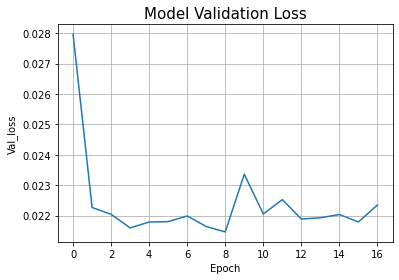

In [62]:
plt.title('Model Validation Loss', size='15')
plt.xlabel('Epoch')
plt.ylabel('Val_loss')
plt.grid(True)
plt.plot(history.history['val_loss'])
plt.savefig('./Result/Graph/Model_Valdation_Loss.png')
plt.show

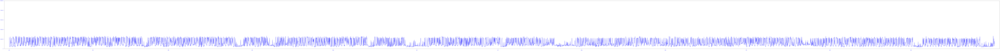

In [63]:
plt.figure(figsize=(300, 15))

plt.tick_params(axis='x', colors='blue', size=15)
plt.tick_params(axis='x', colors='blue', labelsize=12)
plt.tick_params(axis='y', colors='blue', size=15)
plt.tick_params(axis='y', colors='blue', labelsize=12)

plt.plot(pred, label = 'Prediction',color='blue')

plt.xticks([0, 31*24, 59*24, 90*24, 120*24, 151*24, 181*24, 212*24, 243*24, 273*24, 304*24, 334*24], 
           labels=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
plt.yticks([0, 0.2, 0.4, 0.6, 0.8, 1.0], labels=['0', '2000 W', '3500 W', '5500 W', '7000 W', '8500 W'])

plt.margins(x=0.005)
plt.savefig('./Result/Graph/Prediction.png')
plt.show()

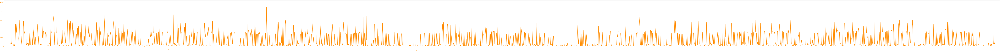

In [64]:
plt.figure(figsize=(300, 15))

plt.tick_params(axis='x', colors='darkorange', size=15)
plt.tick_params(axis='x', colors='darkorange', labelsize=12)
plt.tick_params(axis='y', colors='darkorange', size=15)
plt.tick_params(axis='y', colors='darkorange', labelsize=12)

plt.plot(y_test, label = 'Actual', color='darkorange')

plt.xticks([0, 31*24, 59*24, 90*24, 120*24, 151*24, 181*24, 212*24, 243*24, 273*24, 304*24, 334*24], 
           labels=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
plt.yticks([0, 0.2, 0.4, 0.6, 0.8, 1.0], labels=['0', '2000 W', '3500 W', '5500 W', '7000 W', '8500 W'])

plt.margins(x=0.005)
plt.savefig('./Result/Graph/Actual.png')
plt.show()

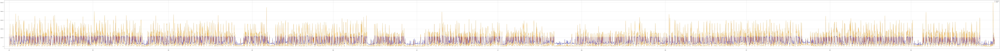

In [65]:
plt.figure(figsize=(300, 15))

plt.tick_params(axis='x', colors='black', size=15)
plt.tick_params(axis='x', colors='black', labelsize=12)
plt.tick_params(axis='y', colors='black', size=15)
plt.tick_params(axis='y', colors='black', labelsize=12)

plt.plot(pred, label = 'Prediction',color='blue')
plt.plot(y_test, label = 'Actual', color='darkorange')

plt.xticks([0, 31*24, 59*24, 90*24, 120*24, 151*24, 181*24, 212*24, 243*24, 273*24, 304*24, 334*24], 
           labels=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
plt.yticks([0, 0.2, 0.4, 0.6, 0.8, 1.0], labels=['0', '2000 W', '3500 W', '5500 W', '7000 W', '8500 W'])
plt.grid(True)
plt.legend()
plt.margins(x=0.005)
plt.savefig('./Result/Graph/Pred_with_Actual.png')
plt.show()

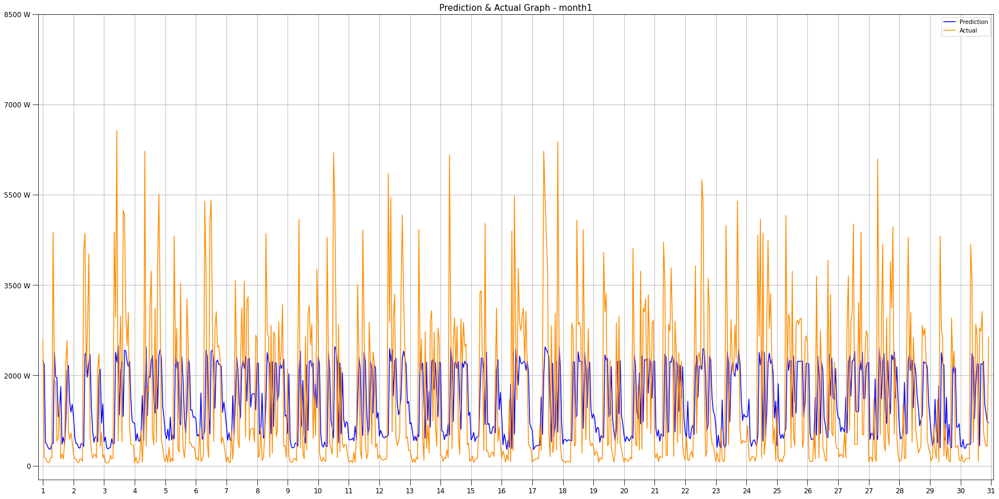

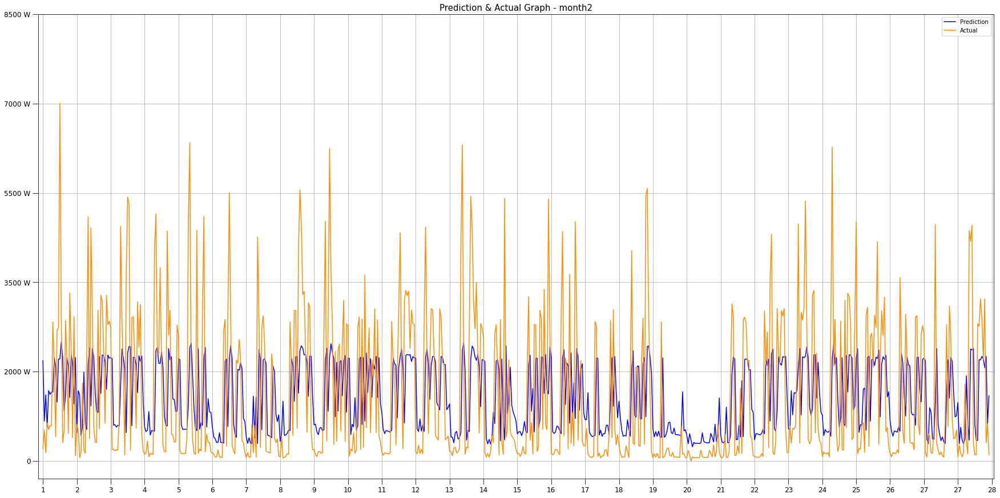

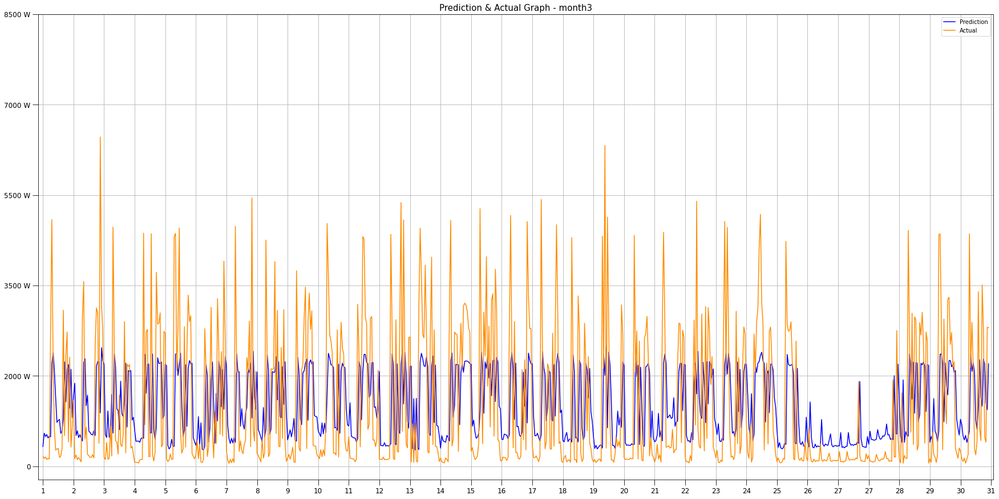

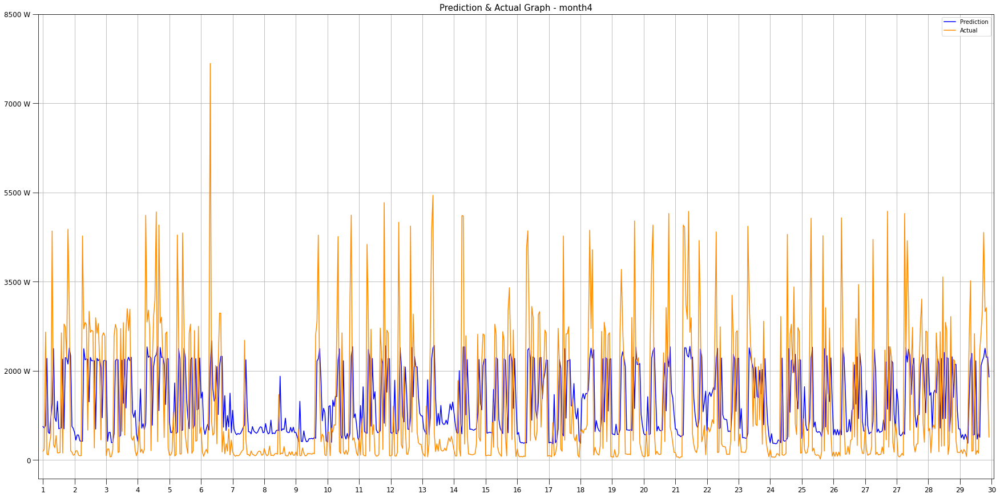

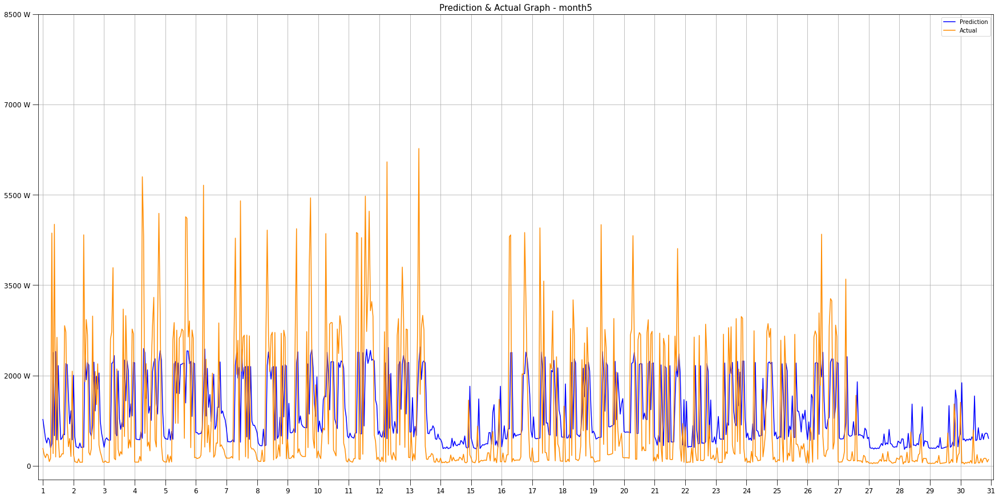

...

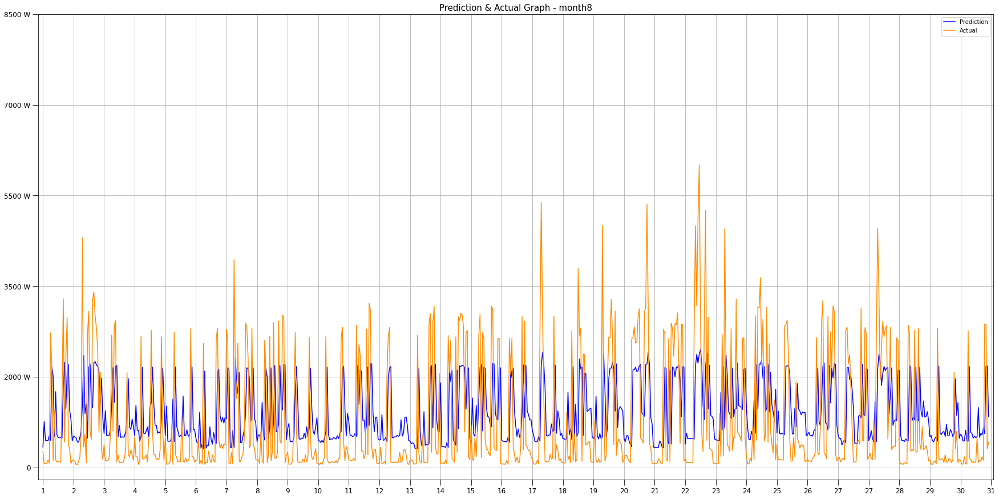

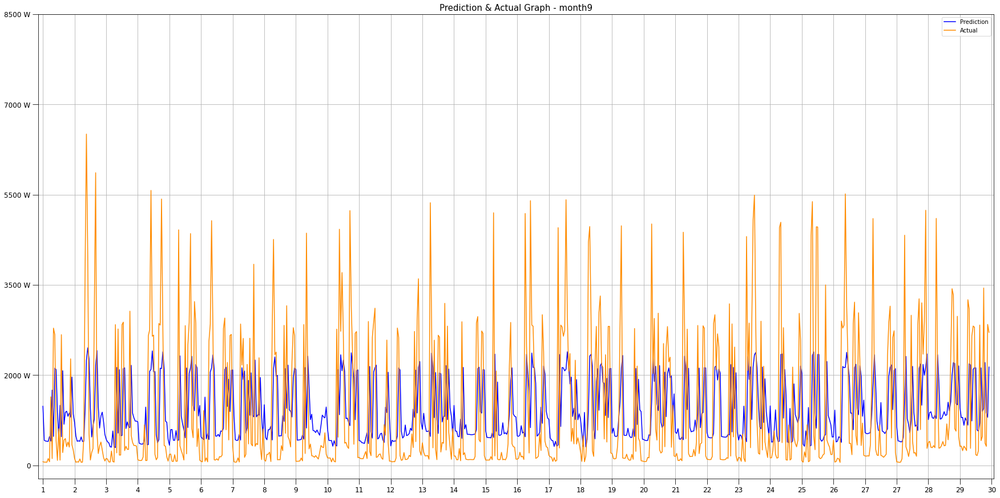

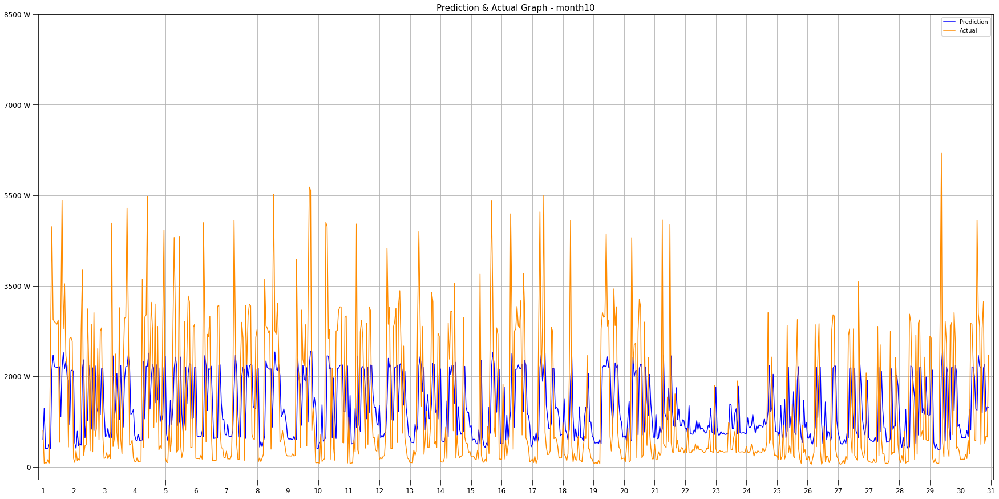

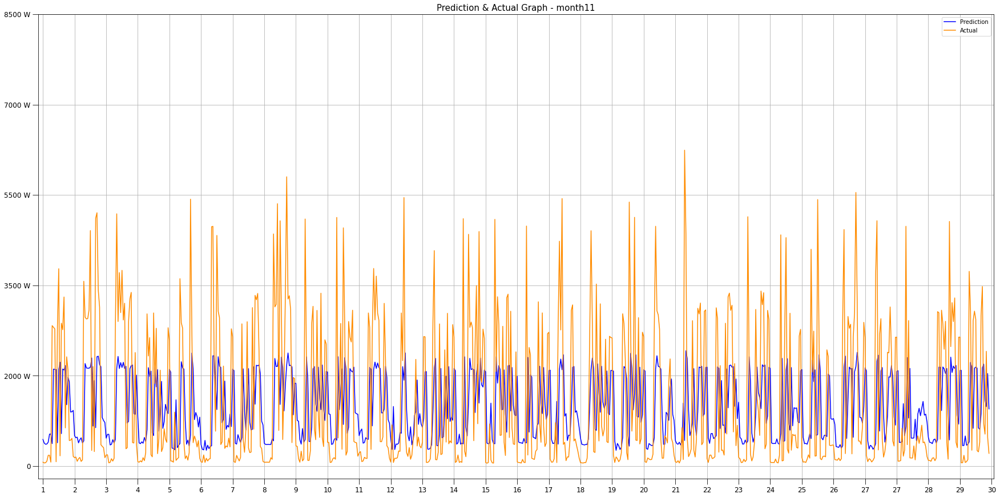

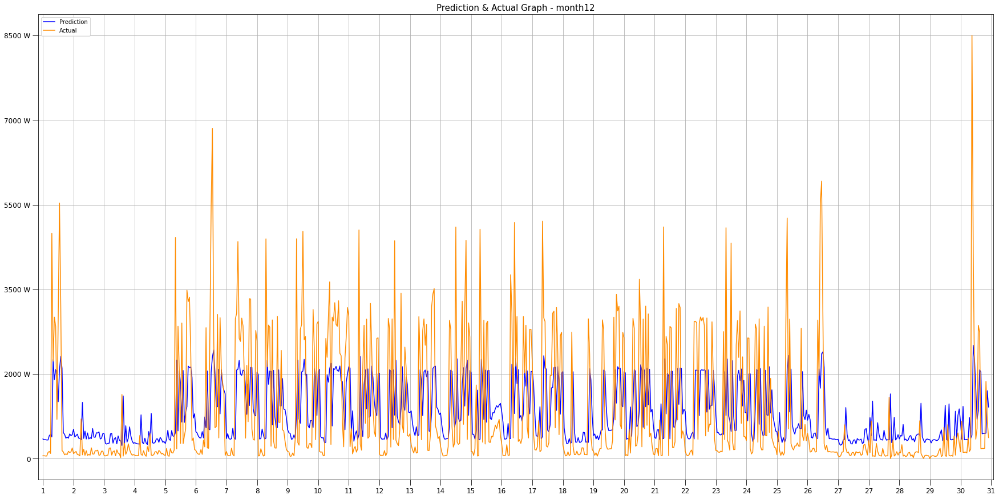

In [66]:
# 월 단위 그래프 분할 표시 및 저장
for m in range(1,13):
    month = {0:0, 1:31, 2:28, 3:31, 4:30, 5:31, 6:30, 7:31, 8:31, 9:30, 10:31, 11:30, 12:31}
    start = {1:0, 2:744, 3:1416, 4:2160, 5:2880, 6:3624, 7:4344, 8:5088, 9:5832, 10:6552, 11:7296, 12:8016}
    end = {1:743, 2:1415, 3:2159, 4:2879, 5:3623, 6:4343, 7:5087, 8:5831, 9:6551, 10:7295, 11:8015, 12:8759}
    
    plt.figure(figsize=(30, 15))
    
    plt.title('Prediction & Actual Graph - month'+str(m), size='15')
    
    plt.tick_params(axis='x', colors='black', size=10)
    plt.tick_params(axis='x', colors='black', labelsize=12)
    plt.tick_params(axis='y', colors='black', size=10)
    plt.tick_params(axis='y', colors='black', labelsize=12)
    
    plt.plot(pred[start[m]:end[m]], label = 'Prediction',color='blue')
    plt.plot(y_test[start[m]:end[m]], label = 'Actual', color='darkorange')
    
    xticks_list_28=[0, 24, 48, 72, 96, 120, 144, 168, 192, 216, 240, 264, 288, 312, 336, 360, 384, 408, 432, 456, 480, 504, 528, 552, 576, 600, 624, 648, 672]
    xticks_list_30=[0, 24, 48, 72, 96, 120, 144, 168, 192, 216, 240, 264, 288, 312, 336, 360, 384, 408, 432, 456, 480, 504, 528, 552, 576, 600, 624, 648, 672, 696, 720]
    xticks_list_31=[0, 24, 48, 72, 96, 120, 144, 168, 192, 216, 240, 264, 288, 312, 336, 360, 384, 408, 432, 456, 480, 504, 528, 552, 576, 600, 624, 648, 672, 696, 720, 744]
    
    if (m==1 or m==3 or m==5 or m==7 or m==8 or m==10 or m==12):
        plt.xticks(xticks_list_31, labels=['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12', '13', '14', '15', 
                                           '16', '17', '18', '19', '20', '21', '22', '23', '24', '25', '26', '27', '27', '28', '29', '30', '31'])
    if (m==4 or m==6  or m==9 or m==11):
        plt.xticks(xticks_list_30, labels=['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12', '13', '14', '15', 
                                           '16', '17', '18', '19', '20', '21', '22', '23', '24', '25', '26', '27', '27', '28', '29', '30'])
    if (m==2):
        plt.xticks(xticks_list_28, labels=['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12', '13', '14', '15', 
                                           '16', '17', '18', '19', '20', '21', '22', '23', '24', '25', '26', '27', '27', '28'])
        
    plt.yticks([0, 0.2, 0.4, 0.6, 0.8, 1.0], labels=['0', '2000 W', '3500 W', '5500 W', '7000 W', '8500 W'])
    
    plt.grid(True)
    plt.legend()
    plt.margins(x=0.005)
    plt.savefig('./Result/Graph/Prediction_with_Actual_'+str(m)+'.png') # 이름 각각!

### 그래프 비교 결과

In [67]:
import cv2
from skimage.metrics import structural_similarity as ssim

In [68]:
# 유사도 측정을 위한 이미지 가공
image1 = cv2.imread('./Result/Graph/Prediction.png')
image2 = cv2.imread('./Result/Graph/Actual.png')

tempDiff1 = cv2.subtract(image1, image2)

gray1 = cv2.cvtColor(image1, cv2.COLOR_BGR2GRAY)
gray2 = cv2.cvtColor(image2, cv2.COLOR_BGR2GRAY)

In [69]:
# 차이 추출을 위한 뺄셈 과정
pred_list=pred.tolist()
actual_list=y_test.tolist()

result_numbers=[]
for minus in range(len(pred_list)):
    result = abs(float(pred_list[minus][0]) - float(actual_list[minus][0]))
    result_numbers.append(result)

In [70]:
(score, diff) = ssim(gray1, gray2, full=True)
sim_score = round(score,5)*100
result_num_total = round(sum(result_numbers),3)
final_score = (len(result_numbers) - result_num_total)/len(result_numbers)*100

print('그래프 유사도 ==>> %.3f %%\n' %sim_score)
print('예측차 판별도 ==>> %.3f %%' %final_score)

그래프 유사도 ==>> 85.065 %

예측차 판별도 ==>> 89.220 %


### 성능 측정 지표

In [71]:
from sklearn.metrics import r2_score as r2
from sklearn.metrics import mean_absolute_error as MAE
from sklearn.metrics import mean_squared_error as MSE
from sklearn.metrics import mean_squared_log_error as MSLE

print('r2 >> %.4f' %r2(y_test, pred)) # 1에 가까워야 좋음
print('MAE >> %.4f' %MAE(y_test, pred)) # 0에 가까워야 좋음
print('MSE >> %.4f' %MSE(y_test, pred)) # 0에 가까워야 좋음
print('RMSE >> %.4f' %np.sqrt(MSE(y_test, pred))) # 0에 가까워야 좋음
print('RMSLE >> %.4f' %np.sqrt(MSLE(y_test, pred))) # 0에 가까워야 좋음

r2 >> 0.1291
MAE >> 0.1078
MSE >> 0.0204
RMSE >> 0.1428
RMSLE >> 0.1179


### 예측값과 실제값 csv 저장

#### 1년 단위 데이터 저장

In [36]:
# 날짜 정보 생성
month = {1:31, 2:28, 3:31, 4:30, 5:31, 6:30, 7:31, 8:31, 9:30, 10:31, 11:30, 12:31}
datetime_list=[]

for m in range(1, 13):
    month = {1:31, 2:28, 3:31, 4:30, 5:31, 6:30, 7:31, 8:31, 9:30, 10:31, 11:30, 12:31}
    for d in range(month[m]):
        d=d+1
        m=int(m)
        d=int(d)
        
        if m<=9:
            m='0'+str(m)
        if d<=9:
            d='0'+str(d)
            
        for h in range(1,25):
            elem = '2016'+'년-'+str(m)+'월-'+str(d)+'일-'+str(h)+'시'
            datetime_list.append(elem)

In [37]:
# 넘파이 어레이를 데이터 프레임으로 변환
pred_df = pd.DataFrame(pred)
actual_df = pd.DataFrame(y_test)

In [38]:
df_for_chart = pd.DataFrame(columns=['datetime', 'pred', 'actual'])
df_for_chart['datetime']=datetime_list
df_for_chart['pred']=pred_df
df_for_chart['actual']=actual_df
df_for_chart.to_csv("./Result/Data/Electric_Prediction_result_data_for_Chart_Year.csv", encoding='cp949')

print('Job Done!!')

Job Done!!


#### 1달 단위 데이터 저장

In [39]:
pred_list=pred_df[0].values.tolist()
actual_list=actual_df[0].values.tolist()

for m in range(1,13):
    month = {0:0, 1:31, 2:28, 3:31, 4:30, 5:31, 6:30, 7:31, 8:31, 9:30, 10:31, 11:30, 12:31}
    start = {1:0, 2:744, 3:1416, 4:2160, 5:2880, 6:3624, 7:4344, 8:5088, 9:5832, 10:6552, 11:7296, 12:8016}
    end = {1:743, 2:1415, 3:2159, 4:2879, 5:3623, 6:4343, 7:5087, 8:5831, 9:6551, 10:7295, 11:8015, 12:8759}
    
    df_for_chart = pd.DataFrame(columns=['datetime', 'pred', 'actual'])
    df_for_chart['datetime']=datetime_list[start[m]:end[m]]
    df_for_chart['pred']=pred_list[start[m]:end[m]]
    df_for_chart['actual']=actual_list[start[m]:end[m]]
    
    df_for_chart.to_csv("./Result/Data/Electric_Prediction_result_data_for_Chart_"+str(m)+".csv", encoding='cp949')
    
print('Job Done!!')

Job Done!!


#### 일주일 단위 데이터 저장

In [40]:
try:
    os.mkdir('./Result/Data/Week')
    print('폴더 생성 완료.')
    
except FileExistsError:
    print('해당 폴더가 이미 존재합니다.')

해당 폴더가 이미 존재합니다.


In [41]:
pred_list=pred_df[0].values.tolist()
actual_list=actual_df[0].values.tolist()

for w in range(-1, round(len(pred)), 7):
    start=w+1
    end=w+7
    
    df_for_chart = pd.DataFrame(columns=['datetime', 'pred', 'actual'])
    df_for_chart['datetime']=datetime_list[start:end]
    df_for_chart['pred']=pred_list[start:end]
    df_for_chart['actual']=actual_list[start:end]
    
    df_for_chart.to_csv("./Result/Data//Week/Electric_Prediction_result_data_for_Chart_"+str(start)+".csv", encoding='cp949')
    
print('Job Done!!')

Job Done!!
